# Breast Cancer Detection

### 1) Import Data

1. Firstly, necessary libraries for analyze are imported. In this assignment, i used sklearn library for normalization and modeling, matplotlib and seaborn for visualize data. Besides, I used KMeans to create a classification model and KNeighborsClassifier for clustering.

In [9]:
import pandas as pd                                          #to import data
import numpy as np
import operator

%matplotlib inline
import matplotlib.pyplot as plt                              #For visualization
import seaborn as sns; sns.set()

from sklearn.preprocessing import MinMaxScaler               #For normalization
from sklearn.cluster import KMeans                           #For classification model
from sklearn.neighbors import KNeighborsClassifier           #For clustering model

from sklearn.model_selection import train_test_split   #For evaluation of classification model
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix

2. Import our csv file with using read_csv function from pandas library.

In [10]:
original_data = pd.read_csv("data.csv", header=0) 

### 2) Check Data

1. In here, we can see statistical information of our data using the describe() function. When we check the number of rows and non null variables in dataset, we observe that there is no missing value except an unnamed column which we can see below.

In [11]:
original_data.describe(include = 'all')

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
unique,NaN,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,357,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,3.037183e+07,NaN,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,NaN,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,NaN,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,NaN,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,NaN,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,NaN,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN


In [12]:
original_data.shape

(569, 33)

### 4) Data Preparing

1. I remove the all null column from dataset, turn ***diagnosis*** column to numeric and after drop ***diagnosis_M*** column to just look ***diagnosis_B*** column to check row is ***belign*** or ***malignant***. This process is necessary applying to data a machine learning model.

In [13]:
original_data = pd.get_dummies(data=original_data,columns=['diagnosis'])
original_data = original_data.loc[:, ~original_data.columns.str.contains('^Unnamed')]
del original_data['diagnosis_M'] 

2. After transformation, we can see that there is no nonnumeric column.

In [14]:
original_data.dtypes

id                           int64
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst            float64
concave points_worst

### 3) Data Normalization

1. We normalize our data because not scaled data is not good for a model. In this assignment, we use min max scaler to scale our data between 1 and 0.

2. Firstly, we copy our data to **normalized_data** variable to compare their differences on results of models. And after, drop fractial_dimension_mean and id columns from it.

In [15]:
normalized_data = original_data.copy()

scaler = MinMaxScaler(feature_range=(0, 1), copy=False)
min_max_scaler = MinMaxScaler() 

scaled = min_max_scaler.fit_transform(normalized_data)  
normalized_data = pd.DataFrame(scaled, columns=normalized_data.columns) 


### 4) Data Visualization

1. Firstly, we visualize our normalized data with scatter matrix and heat map for each 2 predictor.

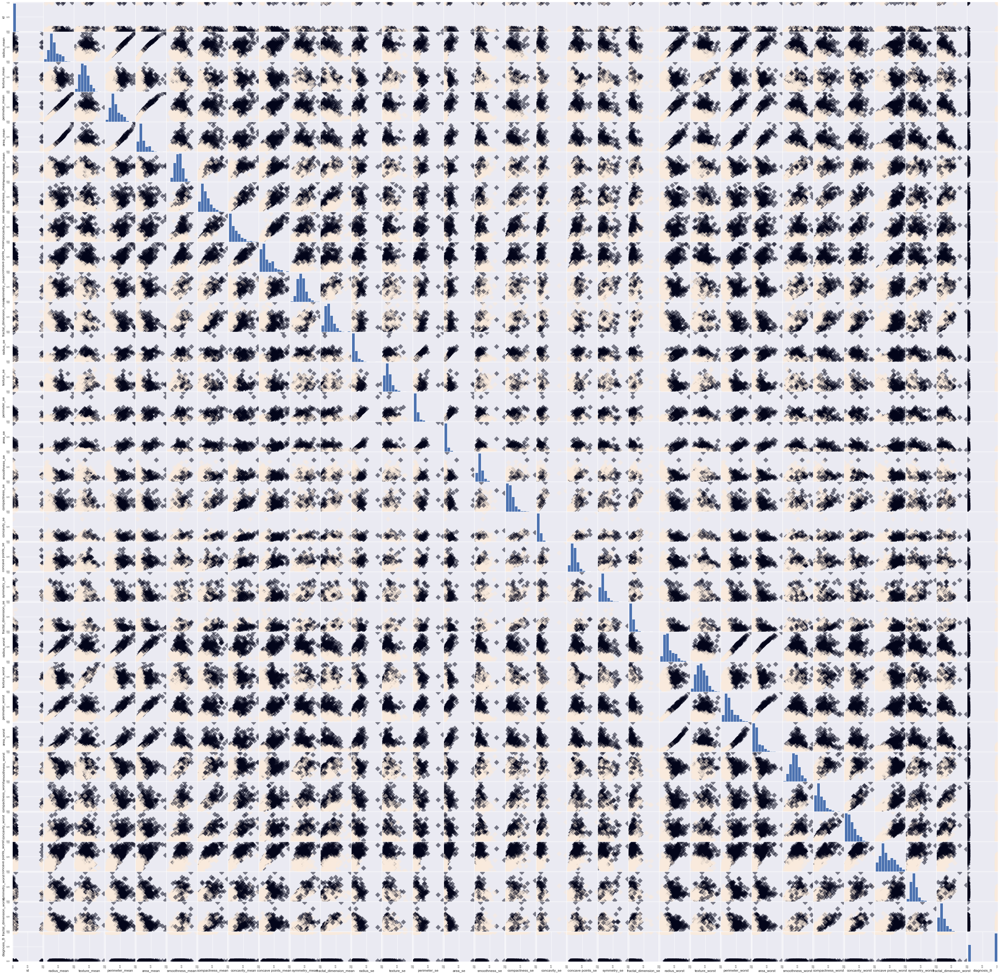

In [16]:
'''
y = normalized_data['diagnosis_B']
plot = pd.plotting.scatter_matrix(normalized_data.iloc[:,:], c = y, figsize = [60,60],s=150, marker ='D')
plt.show()
'''

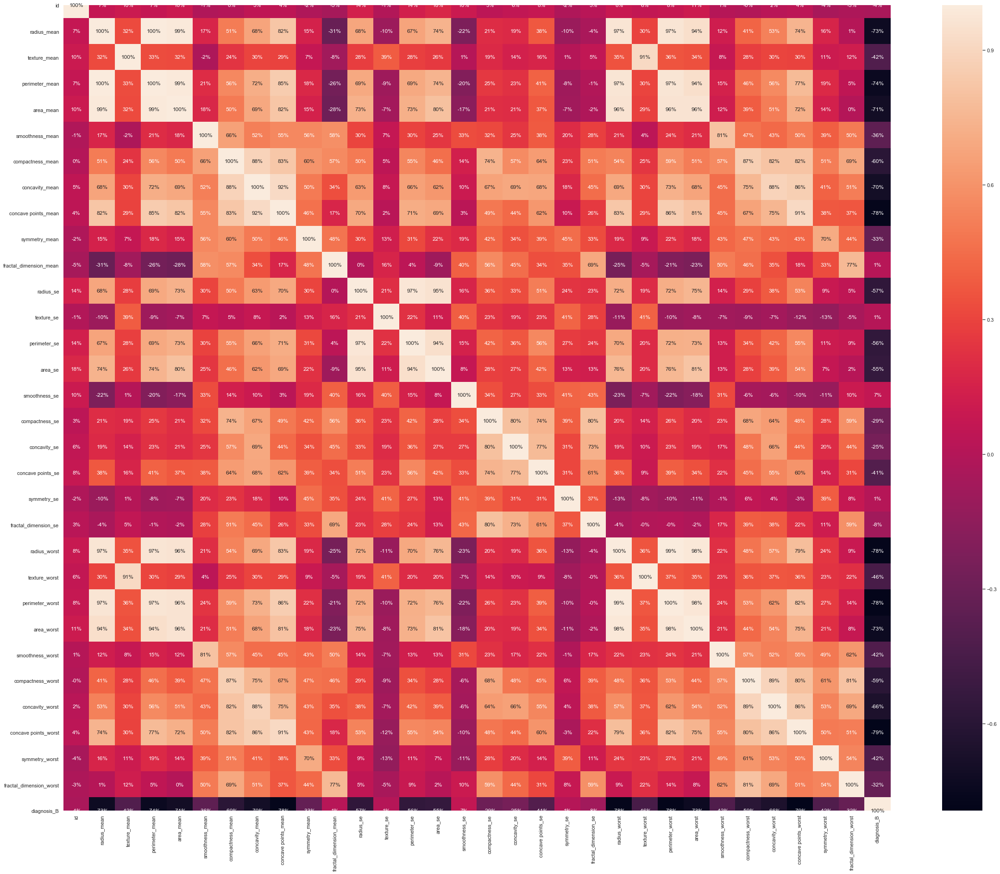

In [16]:
plt.figure(figsize=(40,32))
sns.heatmap(normalized_data.corr(), annot=True, fmt='.0%')

2. When we analyze these 2 plot, we observe that some features have low correlation with diagnosis_B. This can imply that, these attributes doesn't affect the target. And also id field is not necessary for us because it is just a identifier for rows. Also Its correlation is -4% and near to 0 which means that we can drop it according to this information also. I decide to drop **fractial_dimension_mean** column because its correlation with **diagnosis** is 1%.

In [17]:
del normalized_data['id']
del normalized_data['fractal_dimension_mean']

Now, our normalized data ready to look at differences our data model.

### 5) Cluster Data

**5.1) Cluster Not Normalized Data**

1. According to unsupervised learnign, our purpose is find the poosible clusters in dataset without thinking actual labels which are **malignant** or **benign**. In here, we apply this algorithms to not normalized data.

In [18]:
list_column = list(original_data.columns)
list_column.pop()
model = KMeans(n_clusters=2)
y = model.fit(original_data[list_column]) 
new_labels = model.predict(original_data.iloc[:,:-1]) 
original_data['Cluster'] = new_labels 

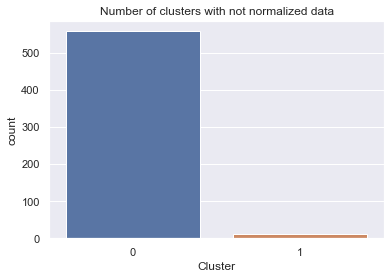

In [19]:
ax = sns.countplot(original_data.iloc[:,-1]).set_title("Number of clusters with not normalized data") 


2. Above, we can see that, acccording to model, there are many 0 cluster instead of 1. But actually in below there should be around %40 rate between clusters.

Text(0.5, 1.0, 'Number of clusters with normalized data')

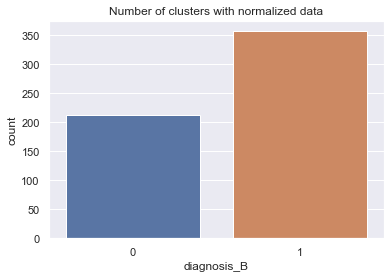

In [20]:
sns.countplot(original_data.iloc[:,-2]).set_title("Number of clusters with normalized data") 

3. We select 2 column to show clusters. Our columns are **texture_mean** and **radius_mean**.

Text(0.5, 1.0, 'Predicted')

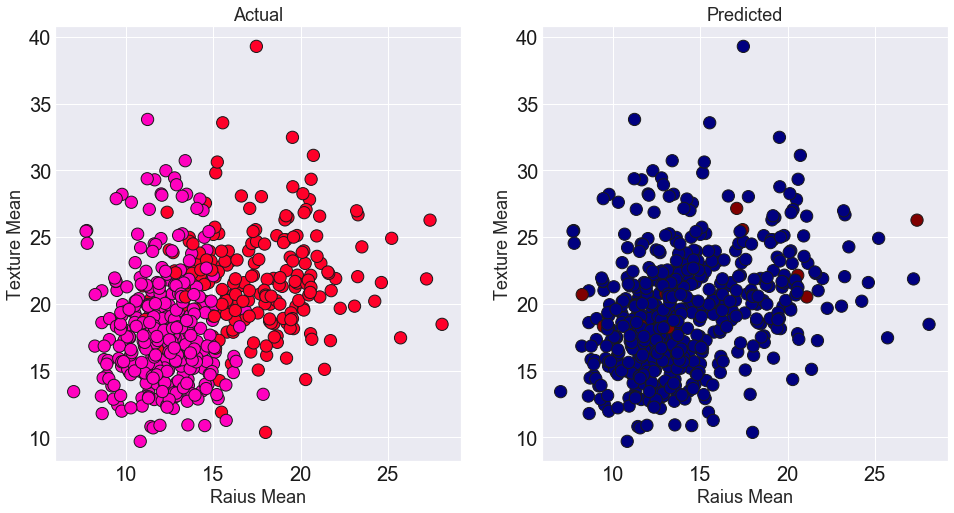

In [21]:


pred_labels = model.labels_

# Plot the identified clusters and compare with the answers
fig, axes = plt.subplots(1, 2, figsize=(16,8))
axes[0].scatter(original_data['radius_mean'], original_data['texture_mean'], c=original_data['diagnosis_B'], cmap='gist_rainbow', edgecolor='k', s=150)
axes[1].scatter(original_data['radius_mean'], original_data['texture_mean'], c=pred_labels, cmap='jet', edgecolor='k', s=150)
axes[0].set_xlabel('Raius Mean', fontsize=18)
axes[0].set_ylabel('Texture Mean', fontsize=18)
axes[1].set_xlabel('Raius Mean', fontsize=18)
axes[1].set_ylabel('Texture Mean', fontsize=18)
axes[0].tick_params(direction='in', length=10, width=5, colors='k', labelsize=20)
axes[1].tick_params(direction='in', length=10, width=5, colors='k', labelsize=20)
axes[0].set_title('Actual', fontsize=18)
axes[1].set_title('Predicted', fontsize=18)

4. We can see that with plot above, original data is not good for cluster data. We try this with normalized data

**5.1) Cluster Normalized Data**

1. We test our cluster model with normalized and prepared data.

In [22]:

list_column = list(normalized_data.columns)
list_column.pop()
model = KMeans(n_clusters=2)
y = model.fit(normalized_data[list_column])
new_labels = model.predict(normalized_data.iloc[:,:-1]) 
normalized_data['Cluster'] = new_labels 
 

2. After, we look at box plot to compare numer of clusters with actual labels.

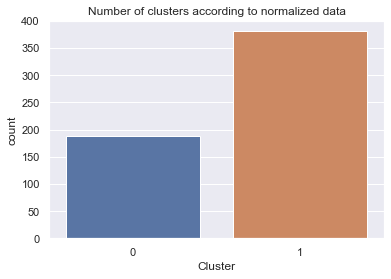

In [23]:
ax = sns.countplot(normalized_data['Cluster']).set_title("Number of clusters according to normalized data") 

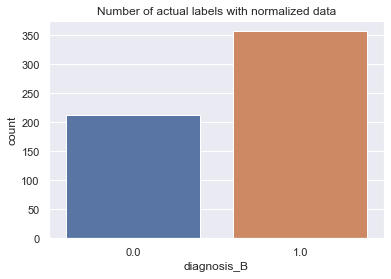

In [24]:
ax2 = sns.countplot(normalized_data.iloc[:,-2]).set_title("Number of actual labels with normalized data") 

3. As we can see above, with normalized data, our model predict almost close to real labels.

4. We look at scatter plots also to compare actual clusters. In first plot, we can see that centers are separeted very well.

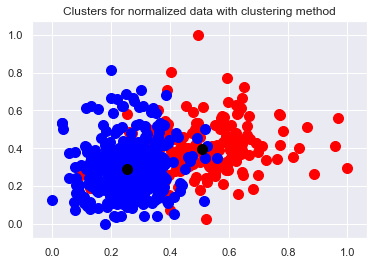

In [25]:
plt.scatter(normalized_data[new_labels == 0]['radius_mean'], normalized_data[new_labels == 0]['texture_mean'], s = 100, c = 'red', label = 'malignant')
plt.scatter(normalized_data[new_labels == 1]['radius_mean'], normalized_data[new_labels == 1]['texture_mean'], s = 100, c = 'blue', label = 'belign')

plt.title("Clusters for normalized data with clustering method")

centers = model.cluster_centers_
plt.scatter(centers[:, 0], centers[:,1], s = 100, c = 'black', label = 'Centroids')


5. With second plot, we can see differences actual clusters which are malignant and benign, with predicted clusters by Kmean algorithm.

Text(0.5, 1.0, 'Predicted')

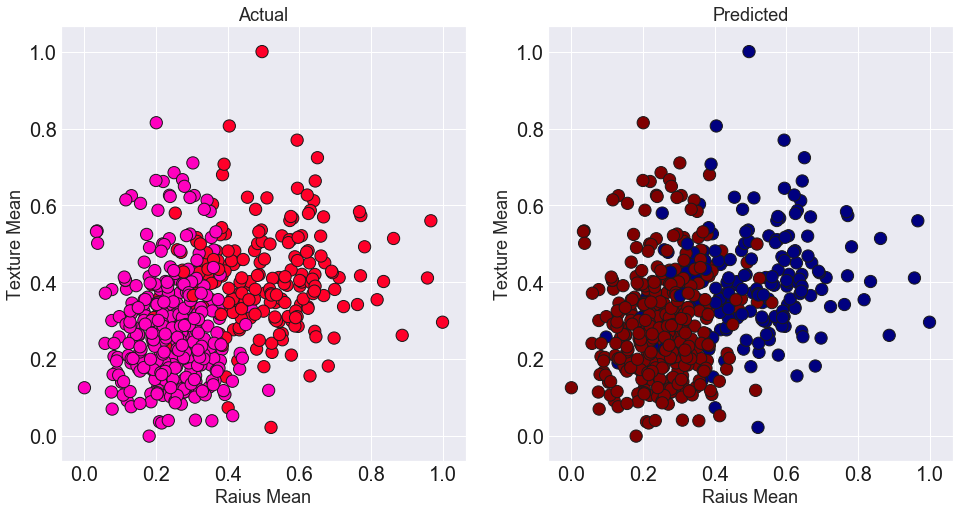

In [26]:
pred_labels = model.labels_

# Plot the identified clusters and compare with the answers
fig, axes = plt.subplots(1, 2, figsize=(16,8))
axes[0].scatter(normalized_data['radius_mean'], normalized_data['texture_mean'], c=normalized_data['diagnosis_B'], cmap='gist_rainbow', edgecolor='k', s=150)
axes[1].scatter(normalized_data['radius_mean'], normalized_data['texture_mean'], c=pred_labels, cmap='jet', edgecolor='k', s=150)
axes[0].set_xlabel('Raius Mean', fontsize=18)
axes[0].set_ylabel('Texture Mean', fontsize=18)
axes[1].set_xlabel('Raius Mean', fontsize=18)
axes[1].set_ylabel('Texture Mean', fontsize=18)
axes[0].tick_params(direction='in', length=10, width=5, colors='k', labelsize=20)
axes[1].tick_params(direction='in', length=10, width=5, colors='k', labelsize=20)
axes[0].set_title('Actual', fontsize=18)
axes[1].set_title('Predicted', fontsize=18)

6. The model makes a very good prediction of the normalized model. When data is scaled and got rid of not necessary columns, the model separates data near to actual labels.

7. We can see below our best number of cluster is 2 with applying elbow method. According to elbow method, we actually should choose where the line seem as a elbow. In here the value of 2 is our data:

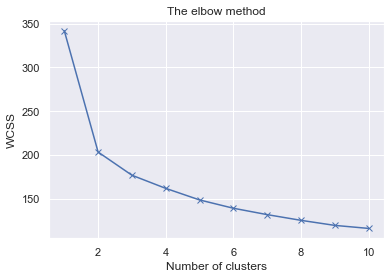

In [27]:
wcss = []
del normalized_data['Cluster']
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(normalized_data[list_column])
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss, 'bx-')
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show() 

In [28]:
del original_data['Cluster']

### 6) Classification

Before starting, we are going to split our data as a test and train for both original and normalized data. This operation is important because of to prevent our model overfitting. Overfitting means that our model extremely adheres to trained data that, the model cannot make an accurate prediction on real-world data whose shape is more different than the tested data.

In [29]:
#For original data
X_train_original_data, X_test_original_data, y_train_original_data, y_test_original_data = train_test_split(original_data.iloc[:,:-1], original_data['diagnosis_B'], test_size=0.25, random_state=0) 

In [30]:
#For normalized data
X_train_normalized_data, X_test_normalized_data, y_train_normalized_data, y_test_normalized_data = train_test_split(normalized_data.iloc[:,:-1], normalized_data['diagnosis_B'], test_size=0.25, random_state=0) 


#### 6.1) Classification with Original Data

1. When we use KNN algorithm for **original data**, our accuracy is 67% for k = 1:

In [31]:

mean=0
dict_score = {}

for i in range(1,101):
    knn_original = KNeighborsClassifier(n_neighbors=25)
    knn_original.fit(X_train_original_data, y_train_original_data)
    y_pred = knn_original.predict(X_test_original_data) 
    score = knn_original.score(X_test_original_data, y_test_original_data) 
    mean = mean+score
    dict_score[i] = score
    

max_key = max(dict_score.items(), key=operator.itemgetter(1))[0]
     
print("mean of accuracy for k is 1 to 100: "+str(mean/100))
print("best score for k = " + str(max_key)+", accuracy = "+ str(dict_score[max_key]))

mean of accuracy for k is 1 to 100: 0.6783216783216797
best score for k = 1, accuracy = 0.6783216783216783


#### 6.2) Classification with Normalized Data

1. After using KNN algorithm for **normalized data**, our result is for different k value is change and our score increase. The reason is, we first scale our data with **min-max standardization** and drop some **predictor** columns which does not any affect on result. 



In [32]:
mean=0 

normalize_dict_score = {}
for i in range(1,101):
    knn_normalized = KNeighborsClassifier(n_neighbors=i)
    knn_normalized.fit(X_train_normalized_data, y_train_normalized_data)    
    score = knn_normalized.score(X_test_normalized_data, y_test_normalized_data)
    mean = mean+score
    normalize_dict_score[i] = score

max_key = max(normalize_dict_score.items(), key=operator.itemgetter(1))[0]
     
print("mean of accuracy for k is 1 to 100: "+str(mean/100))
print("best score for k = " + str(max_key)+", accuracy = "+ str(normalize_dict_score[max_key]))

mean of accuracy for k is 1 to 100: 0.9569930069930074
best score for k = 15, accuracy = 0.972027972027972


2. We can observe the result for different k values the normalized and original data:

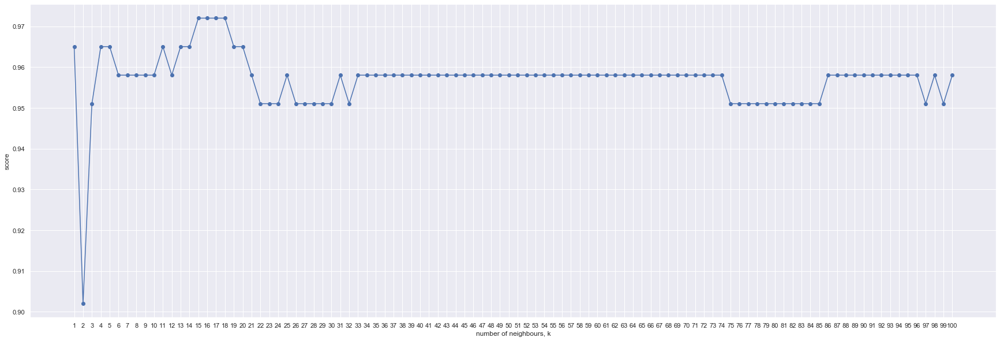

In [33]:
list_k = []
list_score = []

for i in range(1,101):
    list_score.append(normalize_dict_score[i])
    
for i in range(1,101):
    list_k.append(i) 
 

plt.figure(figsize=(30,10))
plt.plot(list_k, list_score, '-o',)
plt.xlabel('number of neighbours, k')
plt.ylabel('score')
plt.xticks(list_k)
plt.show()

3. When i choose the best **k** value as 15 for normalized model the score is 97.2% for normalized data.

#### 6.2) Confusion Matrix and F1-score


1. For the model which is trained with **normalized data** , number of **true positive**, which is benign, is 49 and **true negative**, which is malignant, is 90 which our model predicted exactly. Total exact prediction is **139** row.

In [34]:
#Normalized data

knn_normalized = KNeighborsClassifier(n_neighbors=15)
knn_normalized.fit(X_train_normalized_data, y_train_normalized_data)    
knn_prediction_normalized = knn_normalized.predict(X_test_normalized_data)

print(confusion_matrix(knn_prediction_normalized, y_test_normalized_data))

[[49  0]
 [ 4 90]]


2. In the other hand, for our other model which is trained by **original data**, our confusion matrix like this:

In [35]:
#Original data

knn_original = KNeighborsClassifier(n_neighbors=1)
knn_original.fit(X_train_original_data, y_train_original_data)    
knn_prediction_original = knn_original.predict(X_test_original_data)

print(confusion_matrix(knn_prediction_original, y_test_original_data))

[[31  6]
 [22 84]]


3. Above matrix shows us it can only predict **115** exact solution besides other model which is trained by normalized data.

4. After confusion matrix, We look at F1-score table:

In [36]:
print( classification_report(y_test_normalized_data, knn_normalized.predict(X_test_normalized_data)) ) 

              precision    recall  f1-score   support

         0.0       1.00      0.92      0.96        53
         1.0       0.96      1.00      0.98        90

    accuracy                           0.97       143
   macro avg       0.98      0.96      0.97       143
weighted avg       0.97      0.97      0.97       143



5. When we look at classification report for model which is trained by normalized data, our recall for **malignants** 92%, which implies that the model predicted 92% malignant data in all malignants, for **bening**, predicted 100% bening data which is all benings. F1-score for positive is 97%, for negative is 95%, and for both class is %97 which is close to 100%. If we look at precision values for negative, the model's predictions about negative has not any wrong prediction. For positive and negative, F1-score is balanced which is important to take care of. Besides, in original data, our results more worse than normalized data:

In [38]:
print( classification_report(y_test_original_data, knn_original.predict(X_test_original_data)) ) 

              precision    recall  f1-score   support

           0       0.84      0.58      0.69        53
           1       0.79      0.93      0.86        90

    accuracy                           0.80       143
   macro avg       0.82      0.76      0.77       143
weighted avg       0.81      0.80      0.79       143



6. F1-score is 80% for both belign and malignant prediction and recall for malignant prediction is lesser than other result of normalized model. Also for positive and negative, f1-scores are not balanced which are 69% and 86%. This score is not we want. Our normalizing and dropping redundant columns gave us better results.

### 7) Conclusion

In conclusion, preprocessing operation is necessary to prepare our data to make an accurate prediction. The preparing data cannot be thought that independently from data science. Also in real-world operation, if we make test data normalize with trained data, we can get better prediction. 